# Imports & Data Manipulation

In [1]:
import pandas as pd
import plotly.graph_objects as go
import re

In [2]:
def importAndClean():
    global solar_consumption, grid_consumption, solar_gen, weather, data
    solar_consumption=pd.read_csv('Consumo_fotovoltaica.csv')
    grid_consumption=pd.read_csv('Consumo.csv')
    solar_gen=pd.read_csv('Generacion_fotovoltaica.csv')
    weather=pd.read_csv('Meteorologia.csv')

    solar_consumption['FECHA']=pd.to_datetime(solar_consumption['FECHA'].apply(lambda x: x[:-6]))
    grid_consumption['FECHA']=pd.to_datetime(grid_consumption['FECHA'])
    solar_gen['FECHA']=pd.to_datetime(solar_gen['FECHA'])
    weather['FORECAST_TIMESTAMP']=pd.to_datetime(weather['FORECAST_TIMESTAMP'].apply(lambda x: x[:-6]))

    data = weather.merge(solar_gen, how='inner', left_on='FORECAST_TIMESTAMP', right_on='FECHA')
    data = data.drop(columns=['FECHA']).set_index('FORECAST_TIMESTAMP')

In [3]:
def evaluateImpute(data, solar_gen,method):    
    data = data.sort_index()
    solar_gen = solar_gen.sort_values(by='FECHA')

    # Create figure
    fig = go.Figure()

    # Add first line (data)
    fig.add_trace(go.Scatter(x=data.index, y=data['TOTAL_KWH_ENERGIA'], 
                            mode='lines', name=f'{method} Imputed Values', line=dict(color='red')))

    # Add second line (solar_gen)
    fig.add_trace(go.Scatter(x=solar_gen['FECHA'], y=solar_gen['TOTAL_KWH_ENERGIA'], 
                            mode='lines', name='Solar Gen', line=dict(color='blue')))

    # Update layout
    fig.update_layout(title=f"Imputation of Solar Gen Nulls with {method} Imputed Values",
                    xaxis_title="Date/Index",
                    yaxis_title="Total kWh Energy",
                    legend_title="Dataset")

    # Show plot
    fig.show()

# Null Treatment

In [4]:
importAndClean()

In [5]:
solar_gen.isna().sum()
solar_consumption.isna().sum()

# The only dataset with considerable amount of null values is Generacion_fotovoltaica.csv with 1164 nulls in TOTAL_KWH_ENERGIA

FECHA                0
TOTAL_KWH_ENERGIA    0
dtype: int64

## Correlation Analysis

<Axes: >

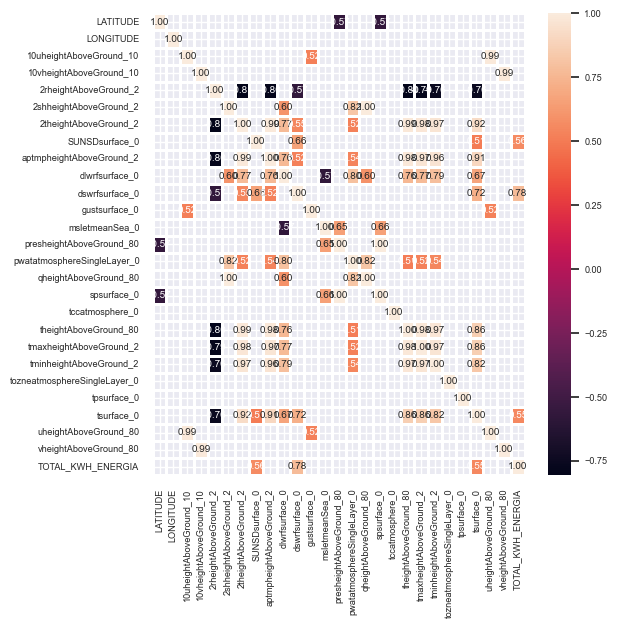

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = data.corr()
sns.set_theme(font_scale=0.6)

high_corr = corr_matrix[abs(corr_matrix) > 0.5]
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(high_corr, annot=True, fmt=".2f", linewidths=1, ax=ax)


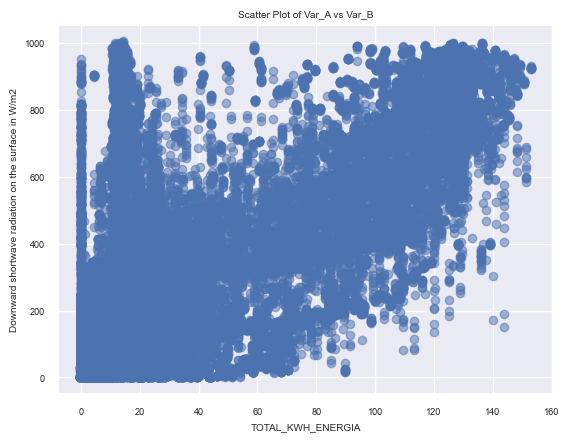

In [7]:
import matplotlib.pyplot as plt

# Sample data
x = data['TOTAL_KWH_ENERGIA']
y = data['dswrfsurface_0']

# Scatter plot
plt.scatter(x, y, alpha=0.5)
plt.xlabel("TOTAL_KWH_ENERGIA")
plt.ylabel("Downward shortwave radiation on the surface in W/m2")
plt.title("Scatter Plot of Var_A vs Var_B")
plt.show()

## KNN Impute (selected fields with more than 0.5 corr with solarGen)

In [8]:
import numpy as np
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# Select features for imputation
selected_features = ['dswrfsurface_0', 'SUNSDsurface_0', 'tsurface_0','TOTAL_KWH_ENERGIA']
data_selected = data[selected_features]

# Scale data (KNN works better with standardized values)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_selected)

# Apply KNN imputation
imputer = KNNImputer(n_neighbors=3)
data_imputed_scaled = imputer.fit_transform(data_scaled)

# Reverse scaling
data_imputed = scaler.inverse_transform(data_imputed_scaled)

# Replace imputed values back into original DataFrame
data[selected_features] = data_imputed

# Print result
data

,LATITUDE,LONGITUDE,10uheightAboveGround_10,10vheightAboveGround_10,2rheightAboveGround_2,2shheightAboveGround_2,2theightAboveGround_2,SUNSDsurface_0,aptmpheightAboveGround_2,dlwrfsurface_0,...,tccatmosphere_0,theightAboveGround_80,tmaxheightAboveGround_2,tminheightAboveGround_2,tozneatmosphereSingleLayer_0,tpsurface_0,tsurface_0,uheightAboveGround_80,vheightAboveGround_80,TOTAL_KWH_ENERGIA
FORECAST_TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2023-07-24 11:00:00,40.0,-4.0,6.989717,1.524463,19.6,0.005070,301.667859,18000.0,300.244031,318.407690,...,0.8,298.878662,301.632129,291.701489,324.006396,0.000,316.100012,7.979102,1.763457,36.303333
2023-07-24 12:00:00,40.0,-4.0,7.526357,1.301797,18.4,0.005260,303.365576,21600.0,301.470923,323.107690,...,1.7,300.500000,303.363452,291.701489,325.803369,0.000,318.700000,8.801675,1.623066,115.660000
2023-07-24 13:00:00,40.0,-4.0,8.506143,1.294370,18.2,0.005665,304.854614,3600.0,302.703198,357.800000,...,8.8,301.995581,304.815100,303.400000,326.096606,0.000,319.277295,9.977305,1.662959,129.980000
2023-07-24 14:00:00,40.0,-4.0,9.392205,1.283123,17.4,0.005709,305.681506,7200.0,303.544031,362.248730,...,5.0,302.944043,305.689685,303.400000,326.790967,0.000,318.515942,11.152161,1.711703,134.350000
2023-07-24 15:00:00,40.0,-4.0,10.167048,1.555879,18.3,0.006080,305.976172,10800.0,303.834607,365.100000,...,35.8,303.432275,305.995581,303.400000,329.955933,0.000,316.435266,12.256921,2.011133,133.900000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-31 19:00:00,40.5,-3.5,-0.279622,3.374214,49.9,0.011767,300.015723,2440.7,300.217041,425.206323,...,6.2,299.353540,301.568335,299.990186,304.885889,0.000,298.699316,0.302695,4.647837,8.360000
2024-08-31 20:00:00,40.5,-3.5,-0.749060,2.089292,53.7,0.011927,299.000000,2440.8,298.957324,400.109772,...,64.5,298.785703,301.590186,298.945117,305.616699,0.000,297.000000,-0.189282,3.087847,0.403333
2024-08-31 21:00:00,40.5,-3.5,-1.161362,1.564026,55.4,0.011943,298.436621,2441.0,298.412097,391.017041,...,100.0,298.344258,301.590186,298.445093,304.719800,0.000,296.500000,-1.075559,2.444722,0.403333


In [9]:
evaluateImpute(data, solar_gen,'KNN')

## Huber Regressor Impute

In [10]:
# Reset to initial data
importAndClean()

In [11]:
import pandas as pd
import numpy as np
from sklearn.linear_model import HuberRegressor


# Splitting data into training (known A values) and missing values
train_df = data.dropna(subset=['TOTAL_KWH_ENERGIA'])
test_df = data[data['TOTAL_KWH_ENERGIA'].isnull()]

# Fit a robust regression model
model = HuberRegressor()
model.fit(train_df[['dswrfsurface_0']], train_df['TOTAL_KWH_ENERGIA'])

# Predict missing values
data.loc[data['TOTAL_KWH_ENERGIA'].isnull(), 'TOTAL_KWH_ENERGIA'] = model.predict(test_df[['dswrfsurface_0']])


In [12]:
evaluateImpute(data, solar_gen,'HuberRegressor')

## Random Forest Imputation

In [37]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

# Apply Random Forest Imputation
imputer = IterativeImputer(estimator=RandomForestRegressor(n_estimators=1, random_state=42), max_iter=1, random_state=42)
data_imputed_scaled = pd.DataFrame(imputer.fit_transform(data_scaled), columns=data.columns)

# Unstandardize the data
data_imputed = pd.DataFrame(scaler.inverse_transform(data_imputed_scaled), columns=data.columns)

data_imputed

KeyboardInterrupt: 

# Real Data Validation

In [25]:
importAndClean()

In [35]:
real2024 = pd.read_csv('00 VerifyData/ActualGen2024.csv')
real2024

Area                                                                              BZN|ES
MTU                                       07.01.2024 03:00 - 07.01.2024 03:15 (CET/CEST)
Solar - Actual Aggregated [MW] (D - 1)                                               8.0
Solar - Actual Aggregated [MW] (D)                                                  40.0
Name: 300, dtype: object

In [29]:
real2024 = pd.read_csv('00 VerifyData/ActualGen2024.csv')
pattern = r"\b\d{2}\.\d{2}\.\d{4} \d{2}:\d{2}\b"
real2024['Timestamp'] = real2024['MTU'].str.extract(f'({pattern})')                       
real2024['Timestamp'] = pd.to_datetime(real2024['Timestamp'], format='%d.%m.%Y %H:%M')
real2024 = real2024.set_index('Timestamp').drop(columns=['MTU','Area'])
#real2024 = real2024.resample('h').sum()


In [36]:
real2024.iloc[90:100]

,Area,MTU,Solar - Actual Aggregated [MW] (D - 1),Solar - Actual Aggregated [MW] (D)
90,BZN|ES,01.01.2024 22:30 - 01.01.2024 22:45 (CET/CEST),60.0,8.0
91,BZN|ES,01.01.2024 22:45 - 01.01.2024 23:00 (CET/CEST),60.0,8.0
92,BZN|ES,01.01.2024 23:00 - 01.01.2024 23:15 (CET/CEST),60.0,8.0
93,BZN|ES,01.01.2024 23:15 - 01.01.2024 23:30 (CET/CEST),60.0,8.0
94,BZN|ES,01.01.2024 23:30 - 01.01.2024 23:45 (CET/CEST),60.0,8.0
95,BZN|ES,01.01.2024 23:45 - 02.01.2024 00:00 (CET/CEST),56.0,8.0
96,BZN|ES,03.01.2024 00:00 - 03.01.2024 00:15 (CET/CEST),8.0,4.0
97,BZN|ES,03.01.2024 00:15 - 03.01.2024 00:30 (CET/CEST),8.0,4.0
98,BZN|ES,03.01.2024 00:30 - 03.01.2024 00:45 (CET/CEST),8.0,4.0
99,BZN|ES,03.01.2024 00:45 - 03.01.2024 01:00 (CET/CEST),8.0,4.0


In [15]:
real2024 = pd.read_csv('00 VerifyData/ActualGen2024.csv')
real2023 = pd.read_csv('00 VerifyData/ActualGen2023.csv')

In [16]:
real2024 = getHourly(real2024)
real2023 = getHourly(real2023)

In [17]:
realData = pd.concat([real2024, real2023]).sort_index()['Solar - Actual Aggregated [MW] (D)']

In [18]:
realData.head(30)

Timestamp
2023-01-01 00:00:00        0.0
2023-01-01 01:00:00        0.0
2023-01-01 02:00:00        0.0
2023-01-01 03:00:00        0.0
2023-01-01 04:00:00        0.0
2023-01-01 05:00:00        0.0
2023-01-01 06:00:00        0.0
2023-01-01 07:00:00        0.0
2023-01-01 08:00:00       68.0
2023-01-01 09:00:00     2296.0
2023-01-01 10:00:00     8148.0
2023-01-01 11:00:00    14156.0
2023-01-01 12:00:00    18024.0
2023-01-01 13:00:00    20196.0
2023-01-01 14:00:00    19340.0
2023-01-01 15:00:00    15056.0
2023-01-01 16:00:00    11176.0
2023-01-01 17:00:00     4608.0
2023-01-01 18:00:00      272.0
2023-01-01 19:00:00        0.0
2023-01-01 20:00:00        0.0
2023-01-01 21:00:00        0.0
2023-01-01 22:00:00        0.0
2023-01-01 23:00:00        0.0
2023-01-02 00:00:00        0.0
2023-01-02 01:00:00        0.0
2023-01-02 02:00:00        0.0
2023-01-02 03:00:00        0.0
2023-01-02 04:00:00        0.0
2023-01-02 05:00:00        0.0
Name: Solar - Actual Aggregated [MW] (D), dtype: float64

In [19]:
dataCheck = pd.merge(data, realData, left_index=True, right_on=realData.index, how='inner').drop(columns=['key_0'])

In [20]:
dataCheck['realSolarData'] = dataCheck['Solar - Actual Aggregated [MW] (D)']
dataCheck.drop(columns=['Solar - Actual Aggregated [MW] (D)'], inplace=True)

<Axes: xlabel='Timestamp'>

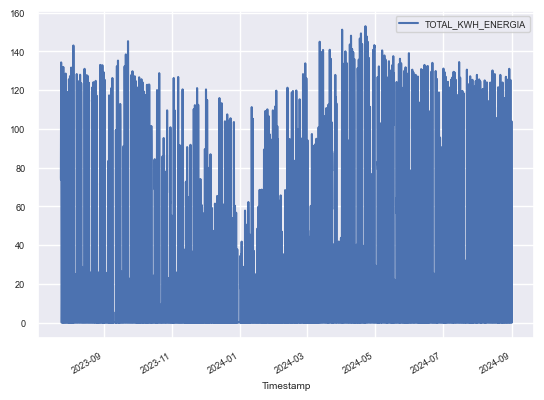

In [21]:
dataCheck.sort_index(inplace=True)
dataCheck[['TOTAL_KWH_ENERGIA']].plot()

<Axes: xlabel='Timestamp'>

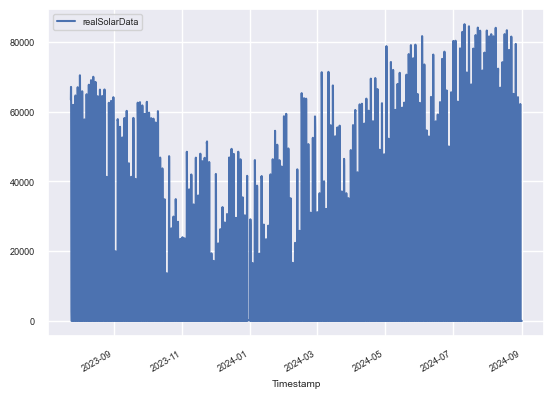

In [22]:
dataCheck[['realSolarData']].plot()